## Preprocessing Images for OCR

In [1]:
#@ IMPORTING THE DEPENDENCIES
import cv2
import matplotlib.pyplot as plt

In [2]:
#@ OPENING AN IMAGE
image_file = "data/page_01.jpg"
img = cv2.imread(image_file)

In [3]:
cv2.imshow('sample image', img)
cv2.waitKey(0)

-1

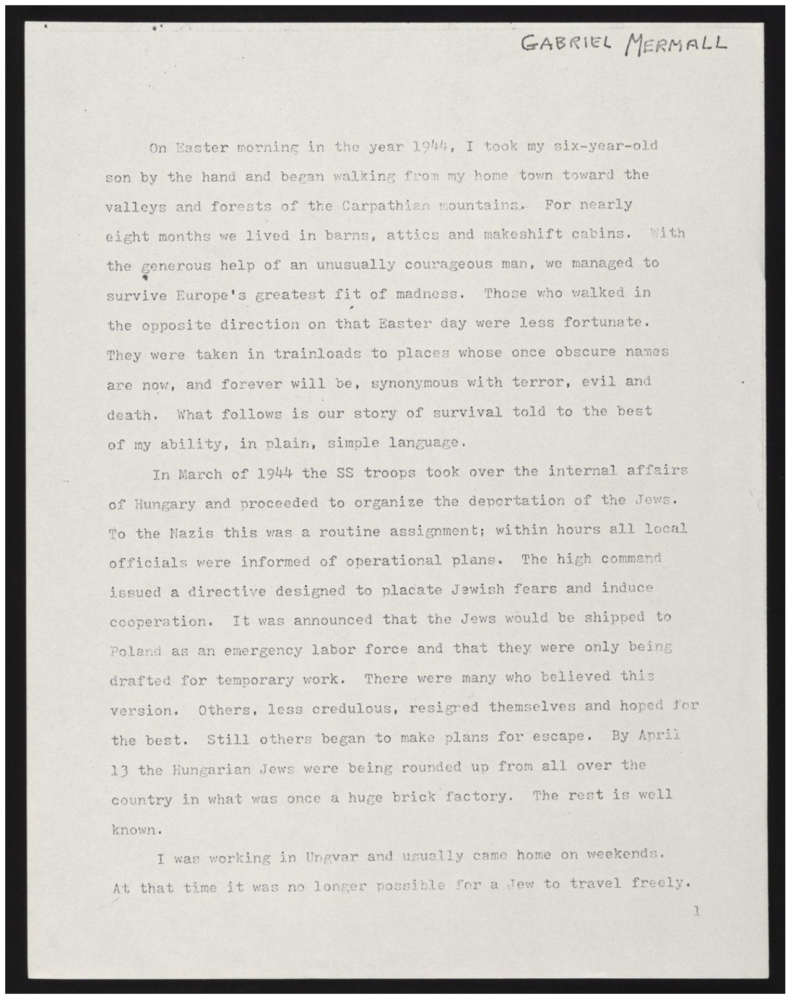

In [4]:
#@ DISPLAY THE IMAGE IN NOTEBOOK
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)
    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()
    
# Give path of the image    
display(image_file)

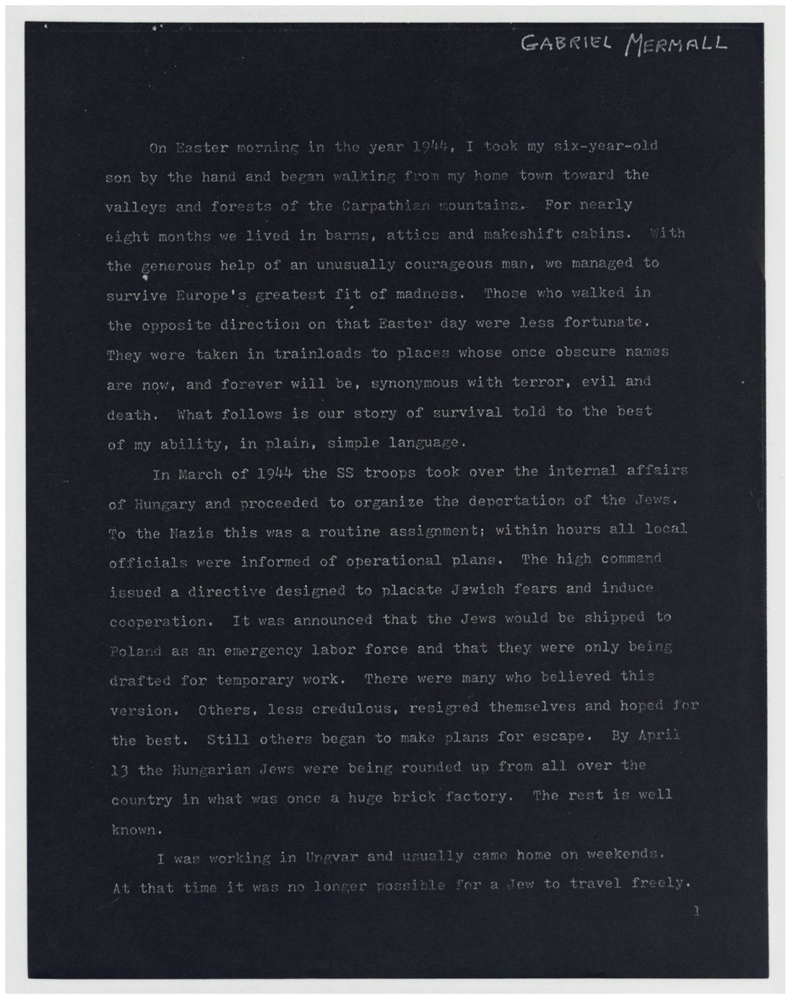

In [6]:
#@ INVERTED IMAGES
inverted_images = cv2.bitwise_not(img)
cv2.imwrite("temp/inverted_image.jpg", inverted_images)
display("temp/inverted_image.jpg")

- Here, the `cv2.bitwise_not()` will convert the white image into grayscale image and vice versa.

**BINARIZATION**

In [7]:
#@ Function to convert the image into grayscale image
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [8]:
gray_image = grayscale(img)
cv2.imwrite("temp/grayscale_image.jpg", gray_image)

True

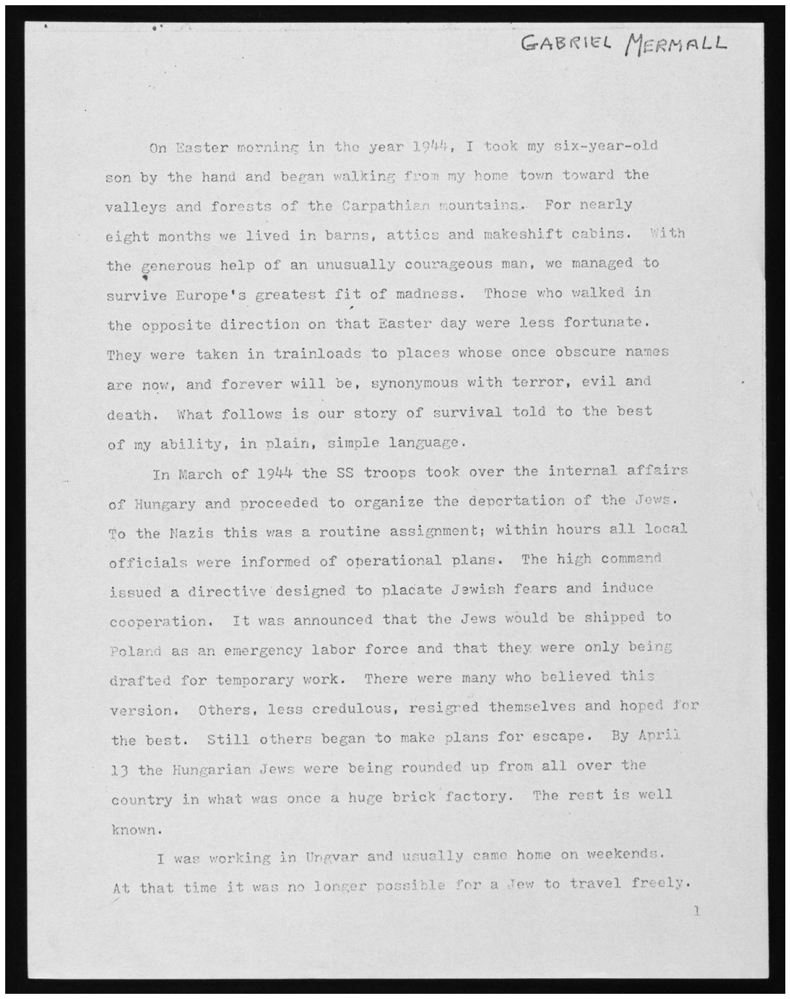

In [9]:
#@ Displaying the grayscale image
display("temp/grayscale_image.jpg")

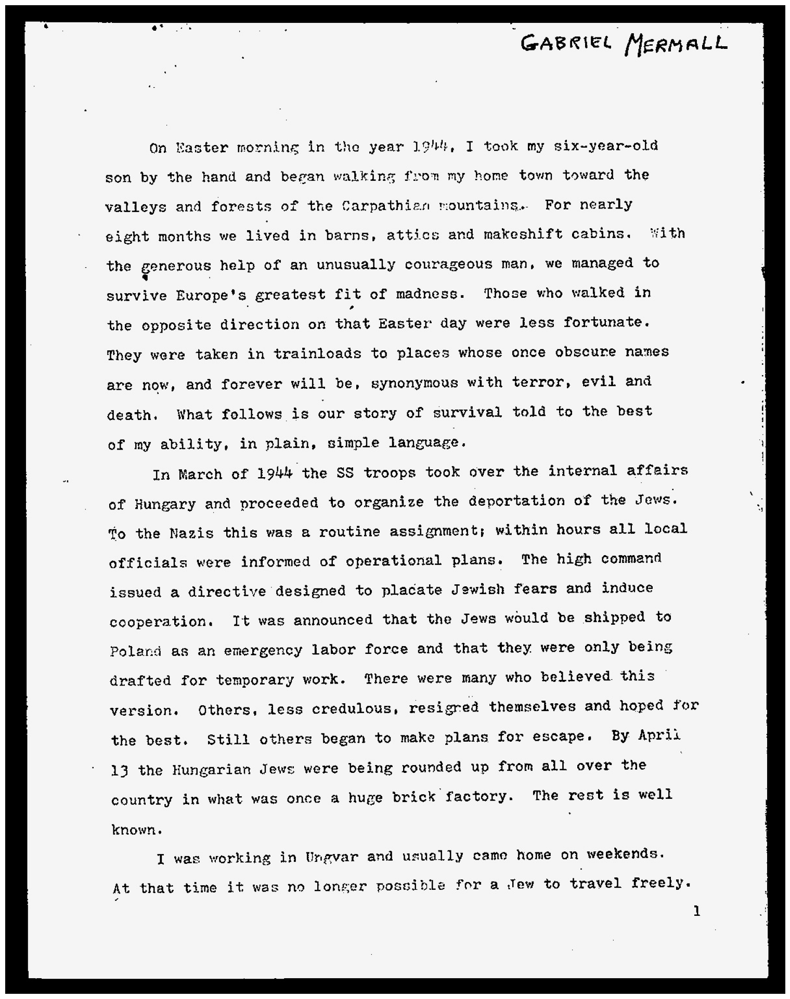

In [11]:
#@ BINARIZATION
thresh, im_bw = cv2.threshold(gray_image, 200, 230, cv2.THRESH_BINARY)
cv2.imwrite("temp/bw_image.jpg", im_bw)
display("temp/bw_image.jpg")

**NOISE REMOVAL**

In [12]:
#@ Function to remove noise
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1,1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1,1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [13]:
no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise.jpg", no_noise)

True

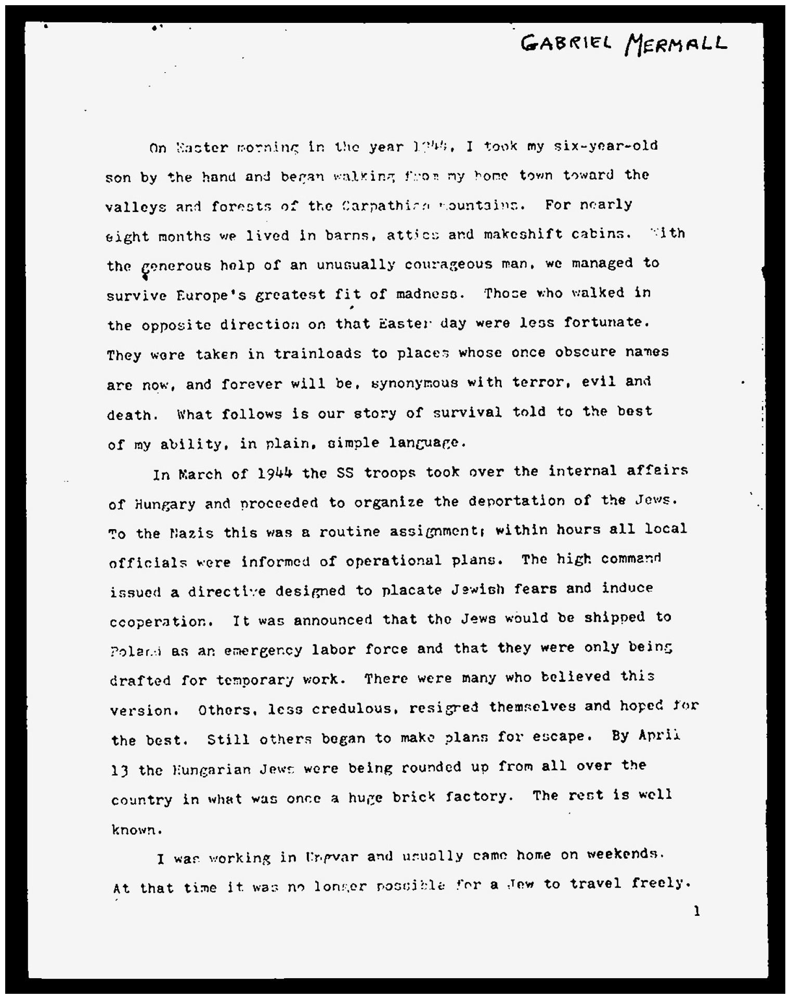

In [14]:
display("temp/no_noise.jpg")

**DILATION AND EROSION**

In [15]:
#@ Changing font into thin size
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

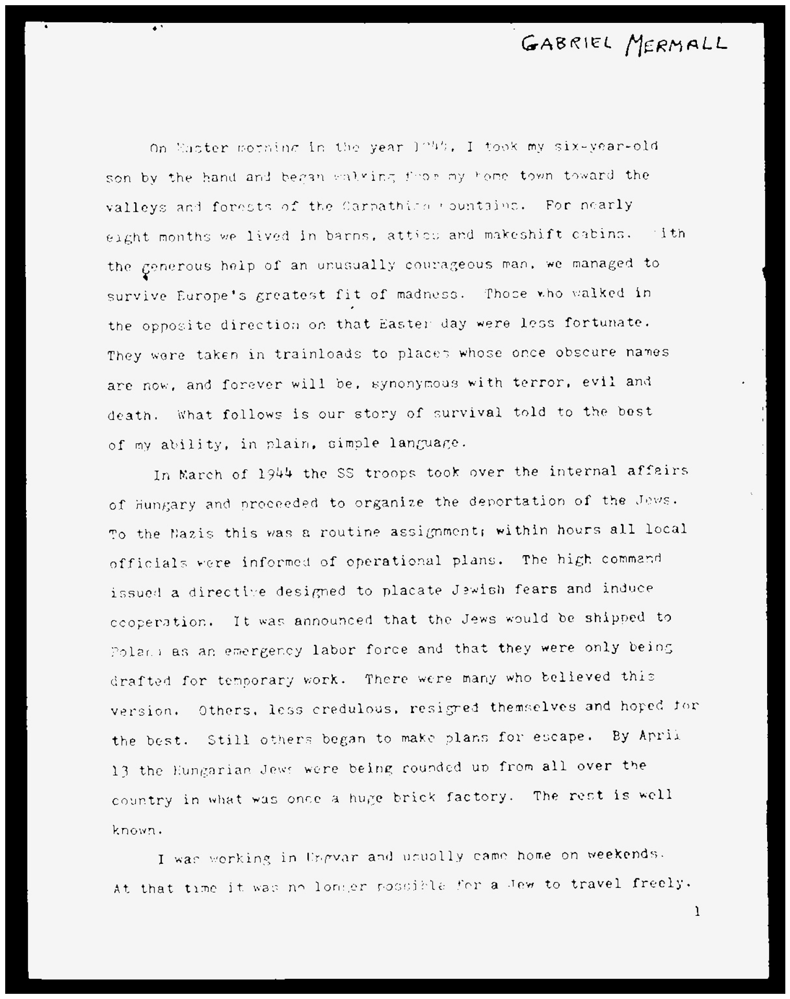

In [16]:
eroded_image = thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg", eroded_image)
display("temp/eroded_image.jpg")

In [17]:
#@ Changing font into thick size
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

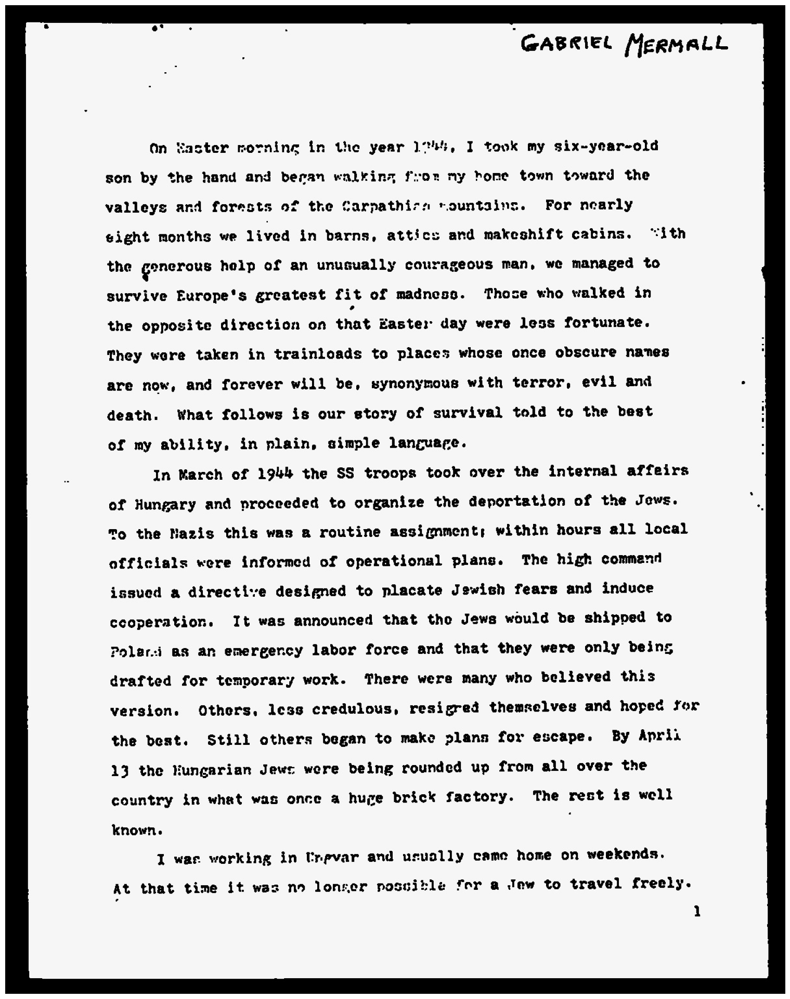

In [18]:
dilated_image = thick_font(no_noise)
cv2.imwrite("temp/dilated_image.jpg", dilated_image)
display("temp/dilated_image.jpg")

**ROTATION / DESKEWING**

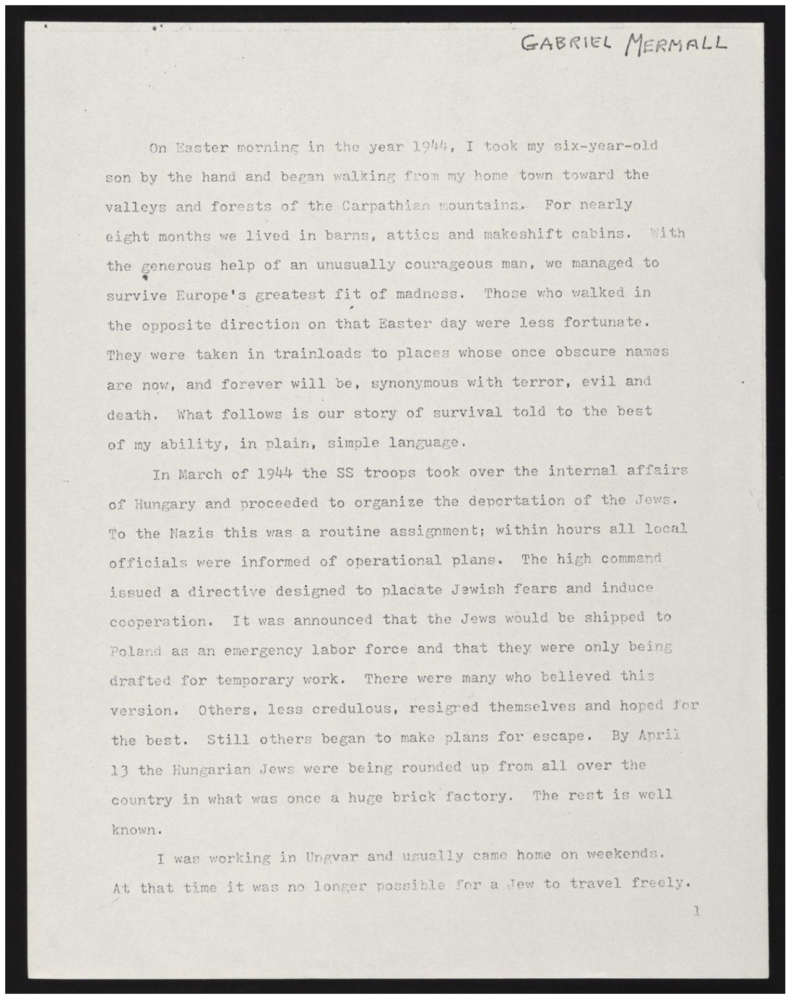

In [19]:
new = cv2.imread("data/page_01.jpg")
display("data/page_01.jpg")

**REMOVING BORDERS**

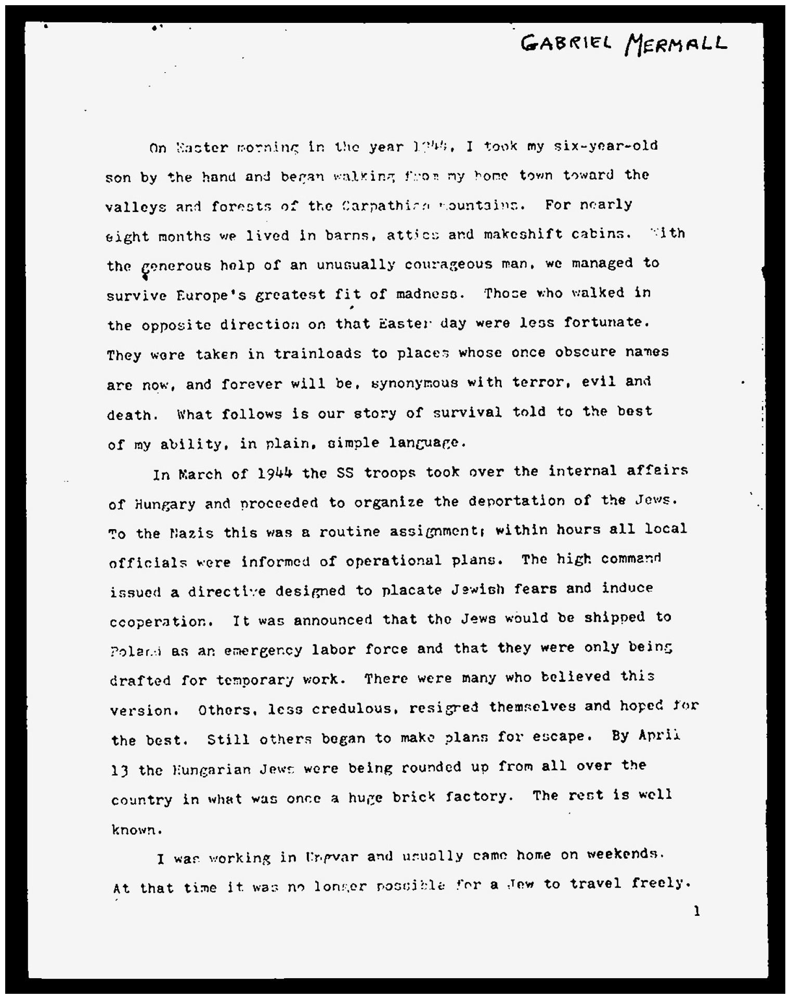

In [20]:
display("temp/no_noise.jpg")

In [21]:
#@ Function to remove borders
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

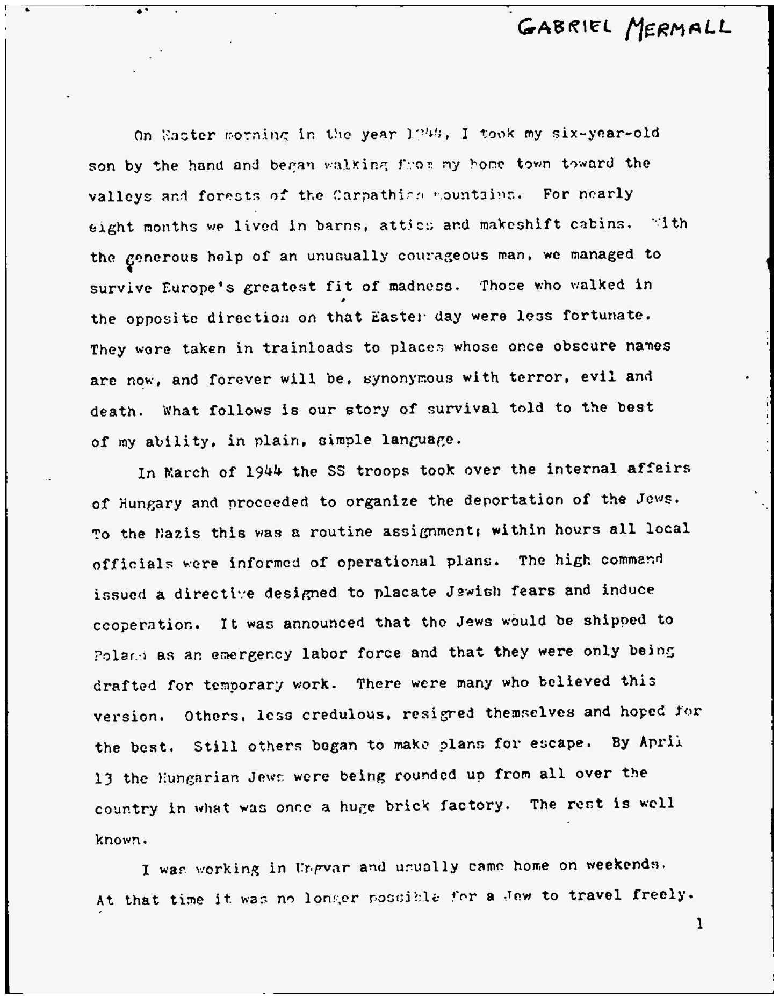

In [22]:
no_borders = remove_borders(no_noise)
cv2.imwrite("temp/no_borders.jpg", no_borders)
display('temp/no_borders.jpg')

**MISSING BORDERS**

In [23]:
color = [255, 255, 255]
top, bottom, left, right = [150]*4

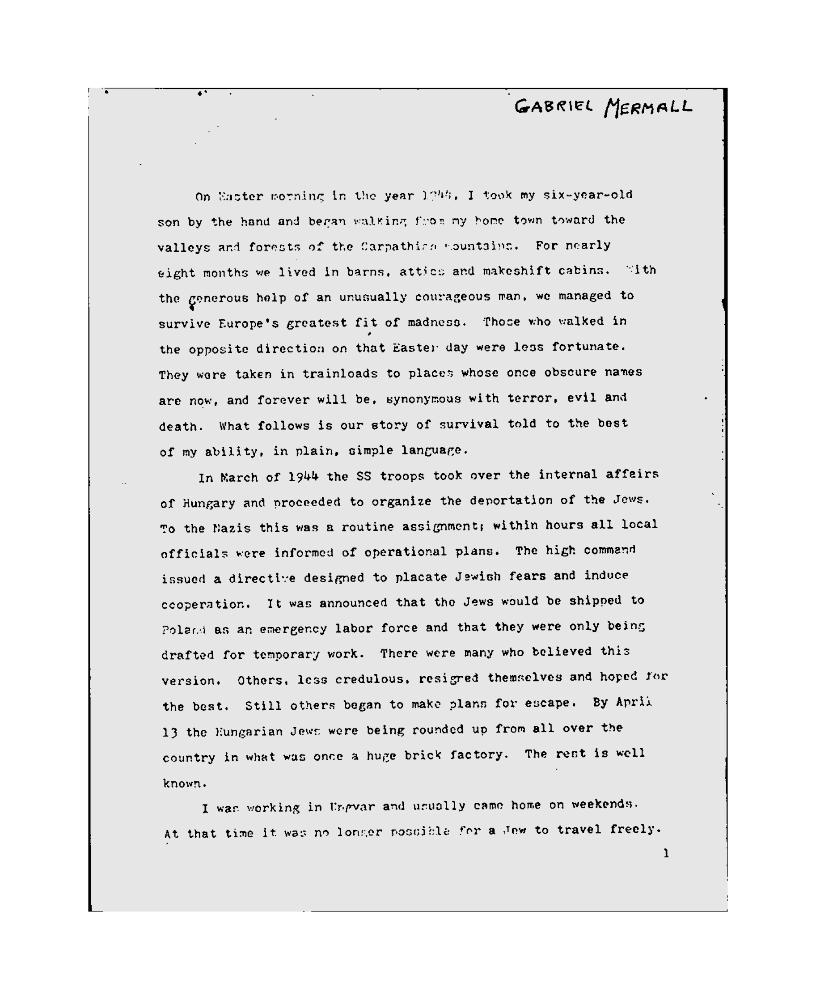

In [24]:
image_with_border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("temp/image_with_border.jpg", image_with_border)
display("temp/image_with_border.jpg")